Step 1: Import Necessary Libraries

In [34]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

Step 2: Define paths and HyperParameters

In [35]:
# Dataset path
data_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset"

# Image processing parameters
img_size = 128  # Ensure img_size is an integer for model input shape
batch_size = 32
epochs = 20  # Limit epochs to 20 for fast training
initial_learning_rate = 0.0005  # Slightly higher LR for faster convergence

step 3:Load and Display Images

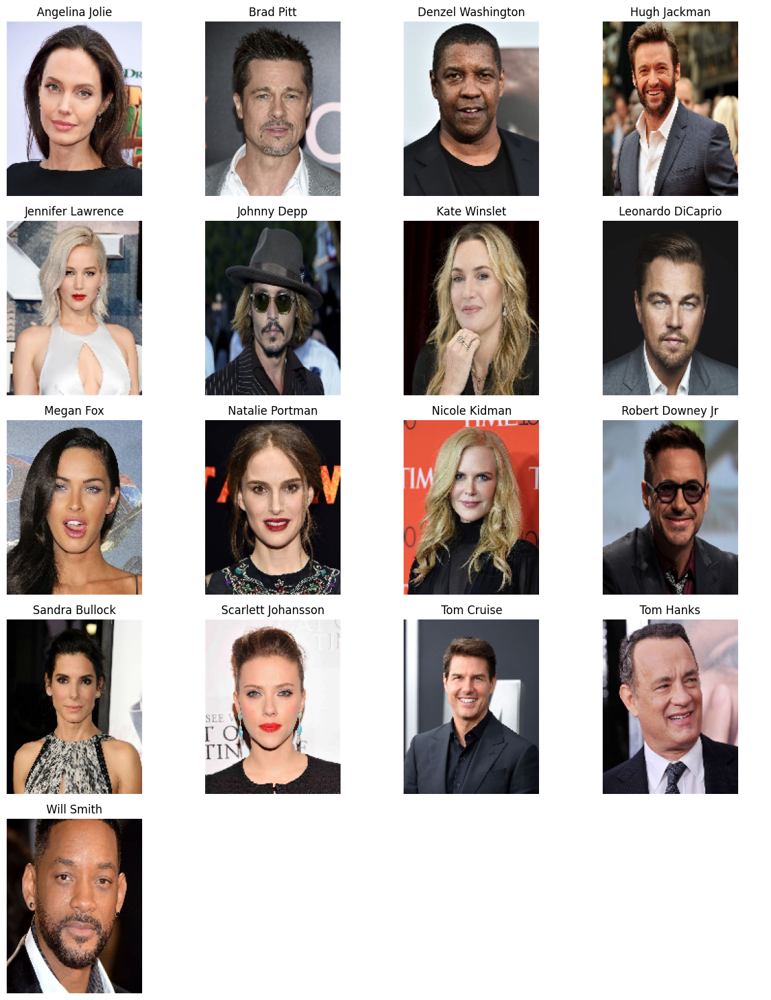

In [36]:
# Parameters for image visualization
resize_size = (140, 180)  # Tuple specifically for image resizing
num_columns = 4  # Number of images per row

# Load images
actor_images = {}
for actor_name in os.listdir(data_path):
    actor_folder = os.path.join(data_path, actor_name)
    if os.path.isdir(actor_folder):
        images = [os.path.join(actor_folder, img) for img in os.listdir(actor_folder) if img.endswith(('.jpg', '.png'))]
        if images:
            actor_images[actor_name] = images[0]  # Select first image of each actor

# Display images
num_rows = (len(actor_images) + num_columns - 1) // num_columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(num_columns * 3, num_rows * 3))

for i, (actor, image_path) in enumerate(actor_images.items()):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, resize_size, interpolation=cv2.INTER_LANCZOS4)  # Use high-quality interpolation

    row, col = divmod(i, num_columns)
    axes[row, col].imshow(img)
    axes[row, col].set_title(actor)
    axes[row, col].axis('off')

# Hide unused subplots
for j in range(i + 1, num_rows * num_columns):
    row, col = divmod(j, num_columns)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

Step 4: Learning Rate Scheduling

In [37]:
# Learning rate decay with warm-up
lr_schedule = ExponentialDecay(
    initial_learning_rate,
    decay_steps=5000,
    decay_rate=0.85,
    staircase=True
)

Step 5: Data Augmentation and preprocessing

In [38]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=45,
    zoom_range=0.4,
    brightness_range=[0.4, 1.6],
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    data_path,
    target_size=(img_size, img_size),  # Now using integer-based img_size
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    data_path,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

Found 1440 images belonging to 17 classes.
Found 360 images belonging to 17 classes.


Step 6: Compute Class Weights

In [39]:
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weight_dict = dict(enumerate(class_weights))

Step 7: Load and Fine-Tune Base Model

In [40]:
# Define MobileNetV2 Model with Correct Input Shape
base_model = MobileNetV2(input_shape=(img_size, img_size, 3), include_top=False, weights="imagenet")

# Fine-tuning: Unfreeze last 35 layers for better learning
for layer in base_model.layers[:-40]:  # Corrected fine-tuning logic
    layer.trainable = False
base_model.trainable = True

Step 8: Define model Arthitecture 

In [41]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation="relu", kernel_regularizer=tf.keras.regularizers.l2(0.005))(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(256, activation="relu", kernel_regularizer=tf.keras.regularizers.l2(0.005))(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)
output = Dense(train_generator.num_classes, activation="softmax")(x)

model = Model(inputs=base_model.input, outputs=output)

Step 9: Compile Model

In [42]:
optimizer = Adam(learning_rate=lr_schedule, clipnorm=1.0)  # Clip gradients to stabilize training
model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

Step 10: Setup Callbacks

In [43]:
early_stopping = EarlyStopping(monitor="val_accuracy", patience=12, restore_best_weights=True)
model_checkpoint = ModelCheckpoint("best_model.h5", monitor="val_accuracy", save_best_only=True)


Step 11: Train Model

In [44]:

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=25,  # Ensures we train for at least 15-20 epochs
    batch_size=batch_size,
    class_weight=class_weight_dict,
    callbacks=[early_stopping, model_checkpoint]
)

C:\Users\PMLS\myenv310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step - accuracy: 0.0847 - loss: 9.1122 

45/45 ━━━━━━━━━━━━━━━━━━━━ 44s 648ms/step - accuracy: 0.0854 - loss: 9.1049 - val_accuracy: 0.1750 - val_loss: 7.8819
Epoch 2/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step - accuracy: 0.2169 - loss: 8.0194 

45/45 ━━━━━━━━━━━━━━━━━━━━ 28s 615ms/step - accuracy: 0.2171 - loss: 8.0168 - val_accuracy: 0.2194 - val_loss: 7.5549
Epoch 3/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 504ms/step - accuracy: 0.3103 - loss: 7.4115 

45/45 ━━━━━━━━━━━━━━━━━━━━ 29s 632ms/step - accuracy: 0.3104 - loss: 7.4095 - val_accuracy: 0.3250 - val_loss: 7.0427
Epoch 4/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 28s 611ms/step - accuracy: 0.3436 - loss: 6.9901 - val_accuracy: 0.2222 - val_loss: 8.0642
Epoch 5/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 27s 596ms/step - accuracy: 0.4023 - loss: 6.5807 - val_accuracy: 0.2667 - val_loss: 7.7281
Epoch 6/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.4884 - loss: 6.1286 

45/45 ━━━━━━━━━━━━━━━━━━━━ 30s 664ms/step - accuracy: 0.4878 - loss: 6.1286 - val_accuracy: 0.3583 - val_loss: 6.8410
Epoch 7/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 508ms/step - accuracy: 0.4679 - loss: 5.8636 

45/45 ━━━━━━━━━━━━━━━━━━━━ 28s 629ms/step - accuracy: 0.4681 - loss: 5.8629 - val_accuracy: 0.3667 - val_loss: 7.9115
Epoch 8/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 27s 603ms/step - accuracy: 0.5385 - loss: 5.4469 - val_accuracy: 0.2583 - val_loss: 7.4802
Epoch 9/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 29s 649ms/step - accuracy: 0.5473 - loss: 5.1550 - val_accuracy: 0.2972 - val_loss: 7.3056
Epoch 10/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 30s 669ms/step - accuracy: 0.5969 - loss: 4.7345 - val_accuracy: 0.2250 - val_loss: 8.1590
Epoch 11/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 29s 648ms/step - accuracy: 0.6200 - loss: 4.3520 - val_accuracy: 0.1750 - val_loss: 10.1523
Epoch 12/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 30s 658ms/step - accuracy: 0.6501 - loss: 4.0842 - val_accuracy: 0.3333 - val_loss: 7.0548
Epoch 13/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 30s 674ms/step - accuracy: 0.6624 - loss: 3.7936 - val_accuracy: 0.2389 - val_loss: 7.8898
Epoch 14/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 29s 650ms/step - accuracy: 0.6645 - loss: 3.6179 - val_accuracy:

45/45 ━━━━━━━━━━━━━━━━━━━━ 31s 679ms/step - accuracy: 0.7314 - loss: 2.8572 - val_accuracy: 0.3806 - val_loss: 5.6493
Epoch 18/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 30s 662ms/step - accuracy: 0.7100 - loss: 2.6831 - val_accuracy: 0.2972 - val_loss: 6.5192
Epoch 19/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 31s 691ms/step - accuracy: 0.7370 - loss: 2.5178 - val_accuracy: 0.2472 - val_loss: 7.7697
Epoch 20/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 29s 654ms/step - accuracy: 0.7463 - loss: 2.3112 - val_accuracy: 0.3056 - val_loss: 6.5559
Epoch 21/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.7873 - loss: 2.1361 

45/45 ━━━━━━━━━━━━━━━━━━━━ 29s 654ms/step - accuracy: 0.7869 - loss: 2.1367 - val_accuracy: 0.4139 - val_loss: 5.1796
Epoch 22/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.7543 - loss: 2.0959 

45/45 ━━━━━━━━━━━━━━━━━━━━ 31s 685ms/step - accuracy: 0.7545 - loss: 2.0951 - val_accuracy: 0.5833 - val_loss: 3.2539
Epoch 23/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 27s 609ms/step - accuracy: 0.7802 - loss: 1.9374 - val_accuracy: 0.3944 - val_loss: 4.9972
Epoch 24/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 27s 600ms/step - accuracy: 0.8094 - loss: 1.7913 - val_accuracy: 0.4083 - val_loss: 3.9721
Epoch 25/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 28s 611ms/step - accuracy: 0.7873 - loss: 1.7006 - val_accuracy: 0.4056 - val_loss: 4.0496


Step 12: Plot Accuracy

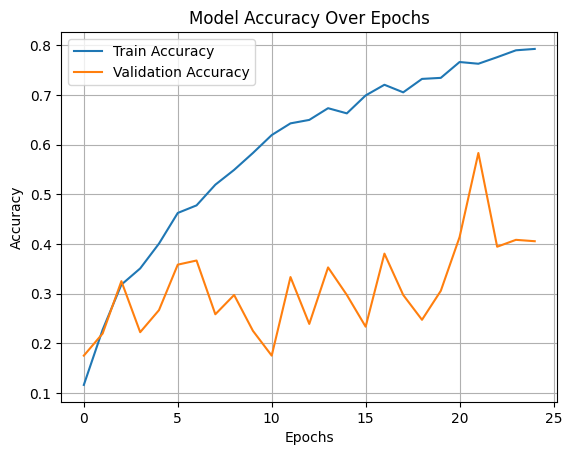

In [45]:
plt.plot(history.history["accuracy"], label="Train Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.title("Model Accuracy Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


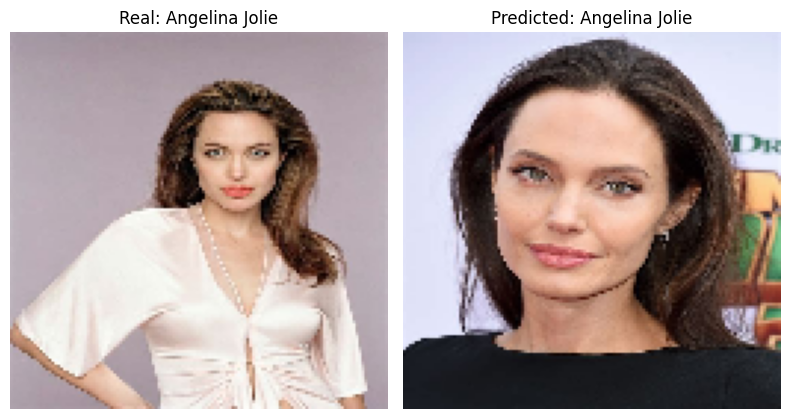

Predicted Actor: Angelina Jolie


In [66]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Angelina Jolie\100_31ff9373.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Angelina Jolie")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


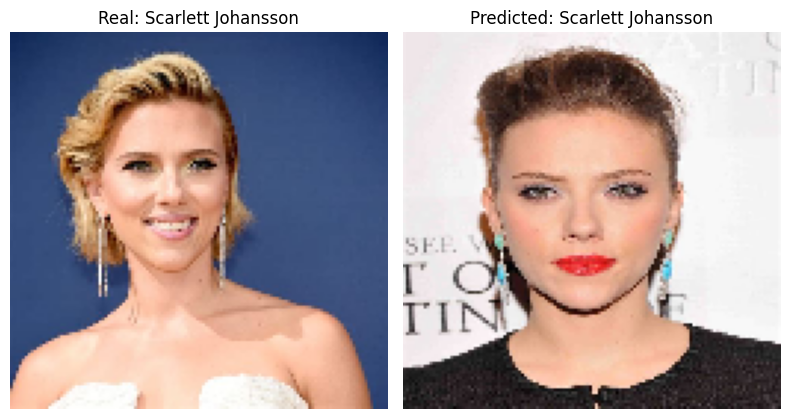

Predicted Actor: Scarlett Johansson


In [75]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Scarlett Johansson\007_c72ff5ba.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Scarlett Johansson")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


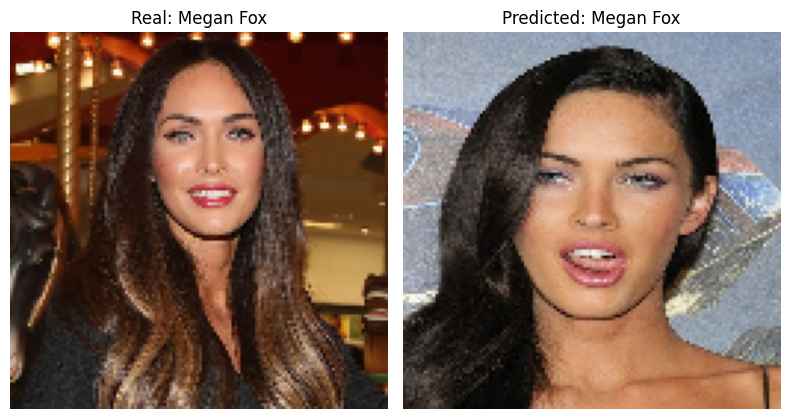

Predicted Actor: Megan Fox


In [74]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Megan Fox\002_6e289116.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Megan Fox")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


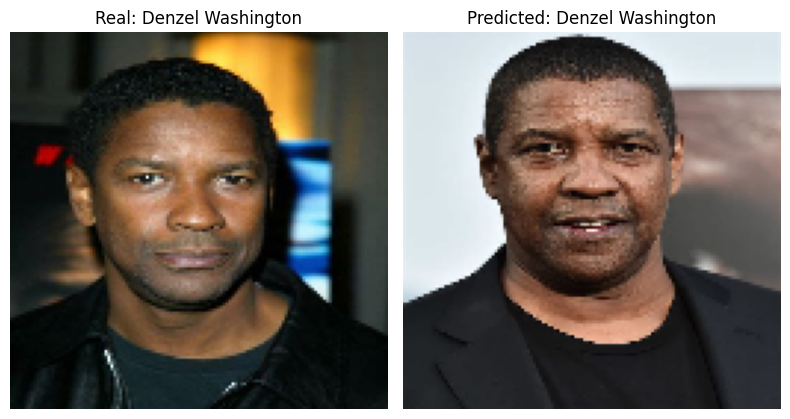

Predicted Actor: Denzel Washington


In [76]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Denzel Washington\094_7858a9ff.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Denzel Washington")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


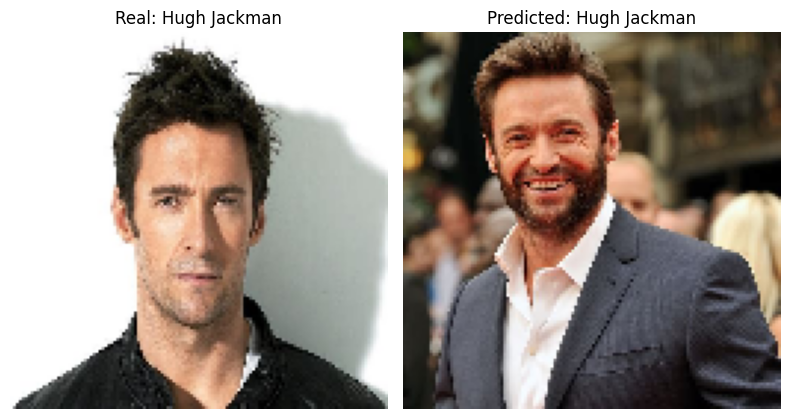

Predicted Actor: Hugh Jackman


In [78]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Hugh Jackman\030_c2291830.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Hugh Jackman")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


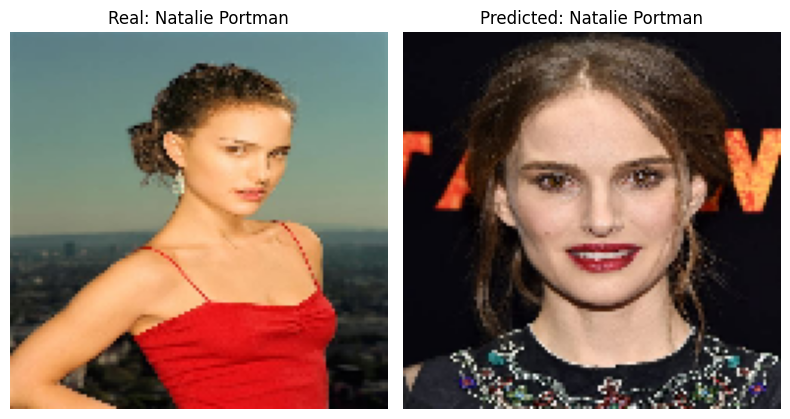

Predicted Actor: Natalie Portman


In [79]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Natalie Portman\010_9f899833.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Natalie Portman")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


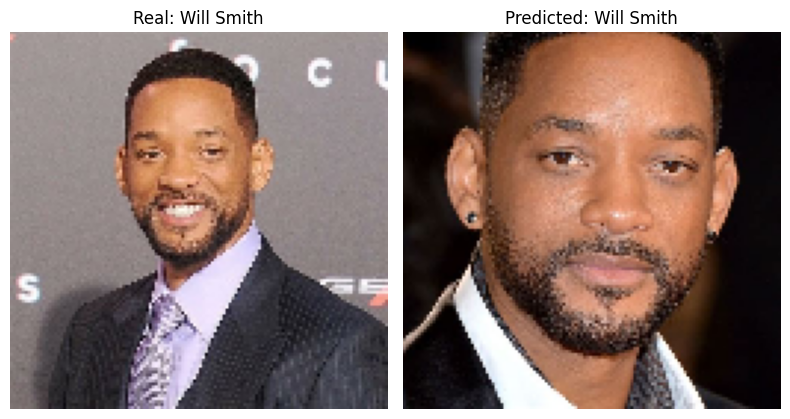

Predicted Actor: Will Smith


In [80]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Will Smith\009_a023db5b.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Will Smith")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


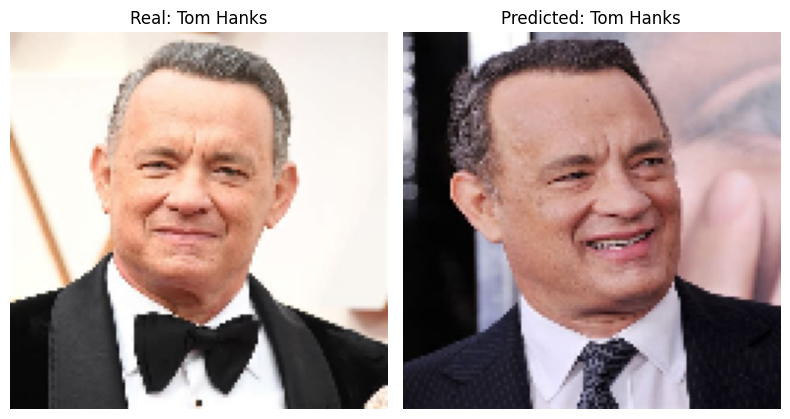

Predicted Actor: Tom Hanks


In [81]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Tom Hanks\004_a5881d85.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Tom Hanks")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


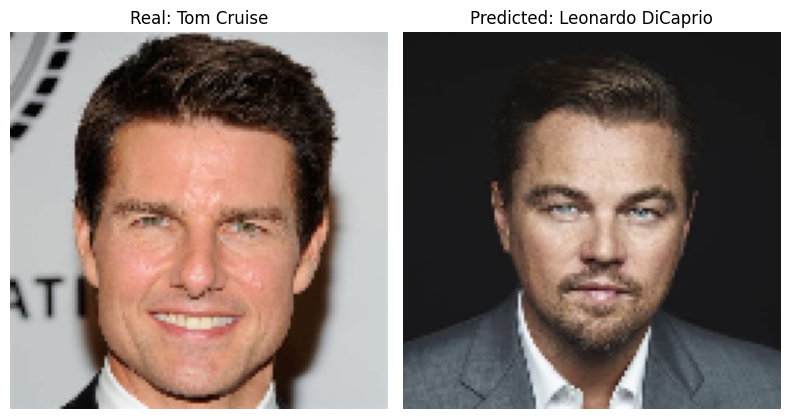

Predicted Actor: Leonardo DiCaprio


In [82]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Tom Cruise\025_72e3b32b.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Tom Cruise")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


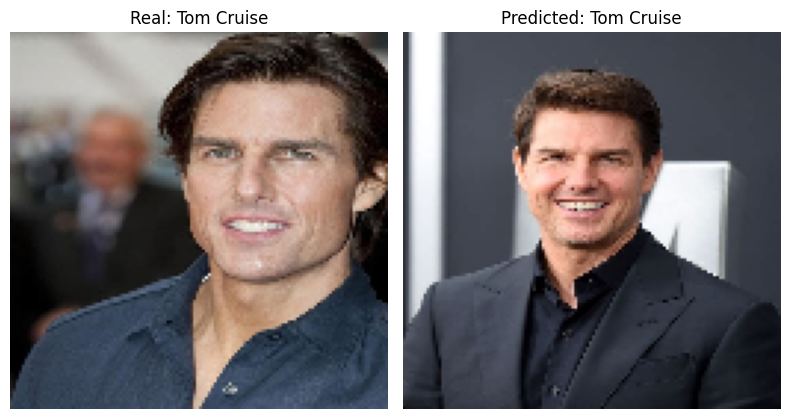

Predicted Actor: Tom Cruise


In [83]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Tom Cruise\007_0a40d399.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Tom Cruise")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


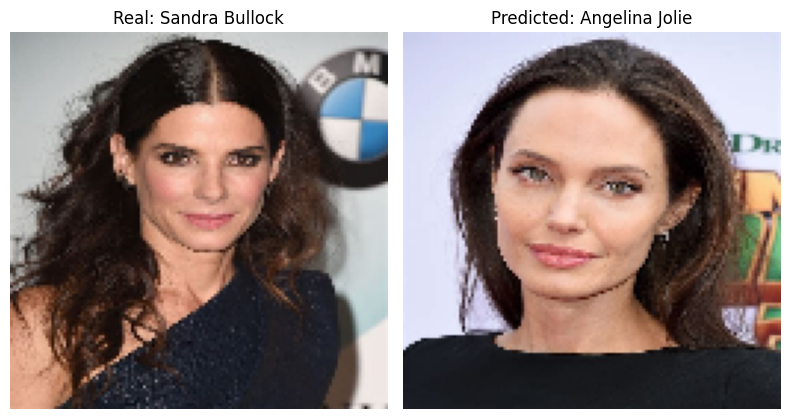

Predicted Actor: Angelina Jolie


In [85]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Sandra Bullock\018_20e2b978.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Sandra Bullock")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


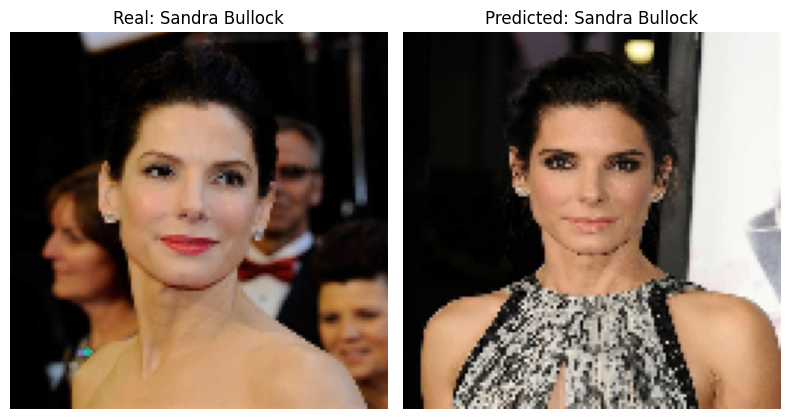

Predicted Actor: Sandra Bullock


In [86]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Sandra Bullock\071_45baaf8f.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Sandra Bullock")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


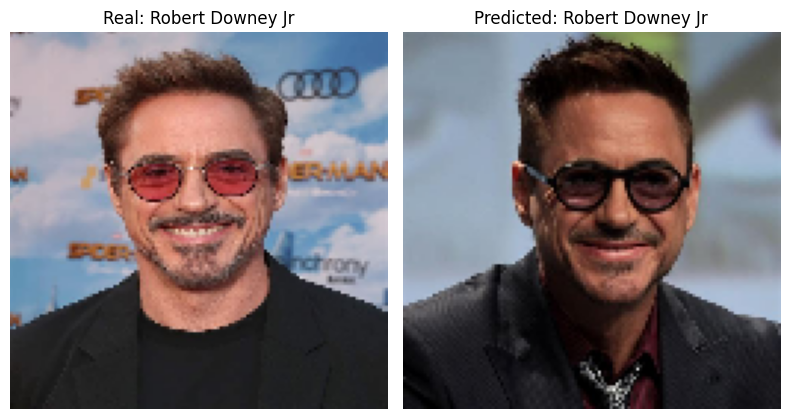

Predicted Actor: Robert Downey Jr


In [87]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Robert Downey Jr\002_cc92e159.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Robert Downey Jr")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


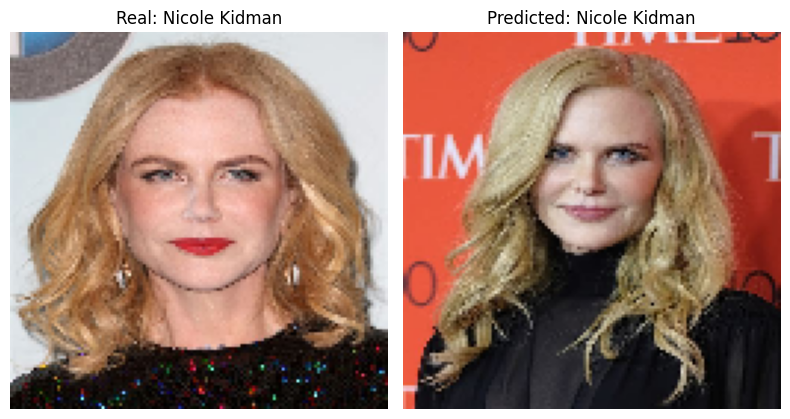

Predicted Actor: Nicole Kidman


In [89]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Nicole Kidman\023_559a07b6.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Nicole Kidman")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


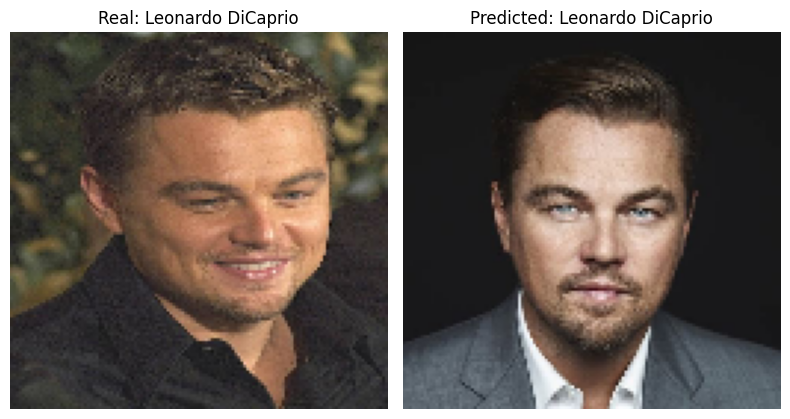

Predicted Actor: Leonardo DiCaprio


In [91]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Leonardo DiCaprio\068_a703f85f.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Leonardo DiCaprio")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


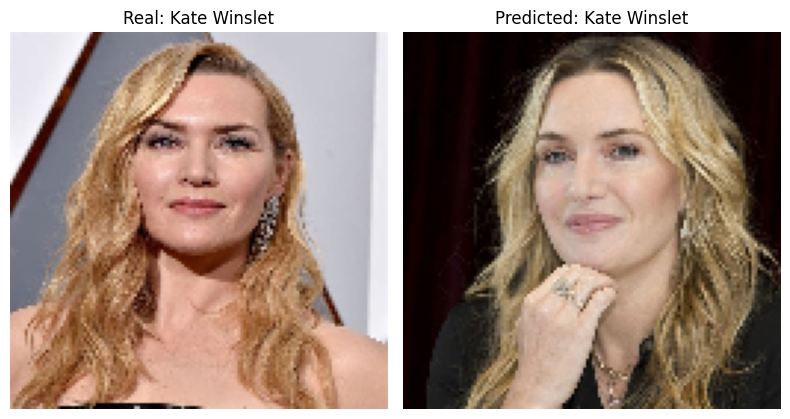

Predicted Actor: Kate Winslet


In [92]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Kate Winslet\100_6cee7c73.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Kate Winslet")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


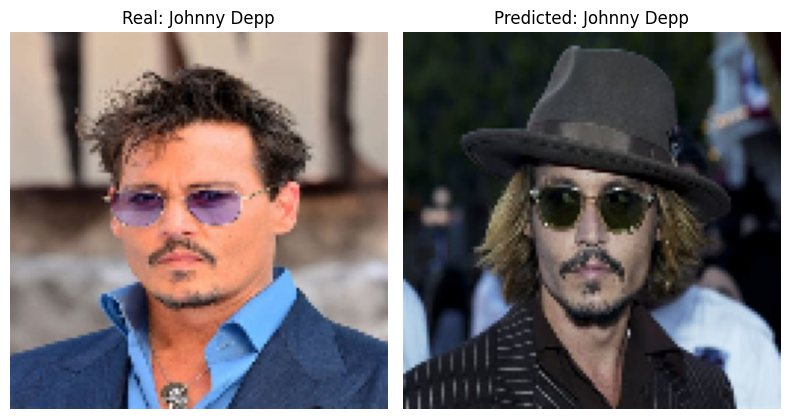

Predicted Actor: Johnny Depp


In [93]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Johnny Depp\059_27a0e6f1.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Johnny Depp")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


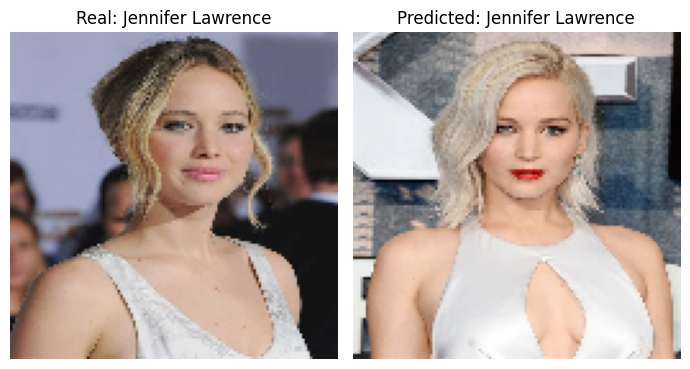

Predicted Actor: Jennifer Lawrence


In [98]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Jennifer Lawrence\011_8c50c05f.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(7, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Jennifer Lawrence")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


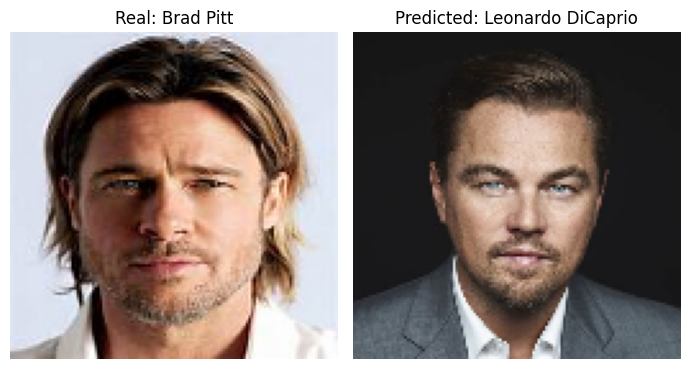

Predicted Actor: Leonardo DiCaprio


In [99]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Brad Pitt\018_136dbb40.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(7, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Brad Pitt")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


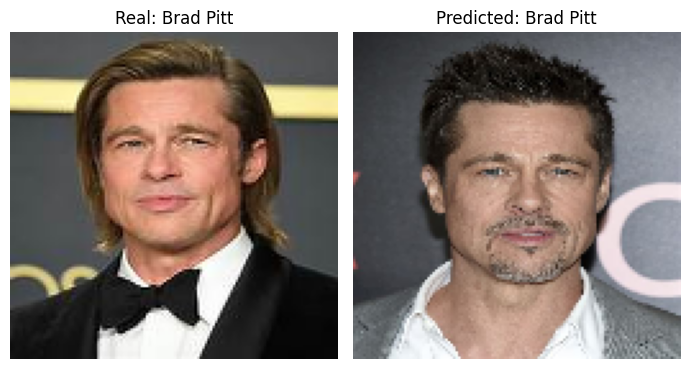

Predicted Actor: Brad Pitt


In [101]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Celebrity Faces Dataset\Brad Pitt\011_270cd3ea.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(7, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Brad Pitt")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

 Test Model on a Celebrity Face Image

Test Image Not in data set

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


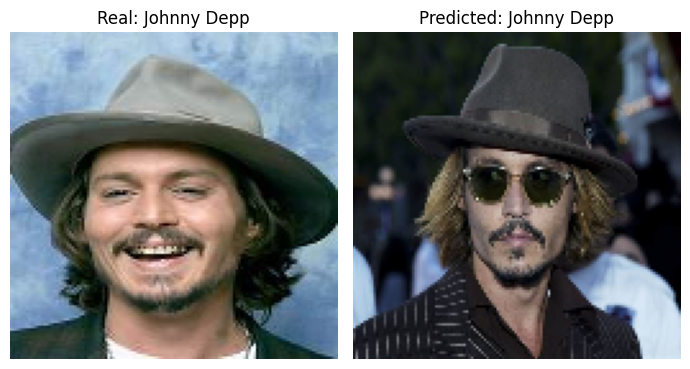

Predicted Actor: Johnny Depp


In [106]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\johny.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(7, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Johnny Depp")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")

Test Image not in Data Set

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


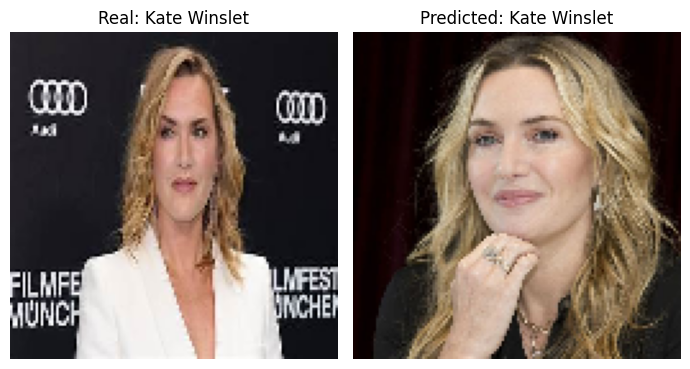

Predicted Actor: Kate Winslet


In [110]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\kate.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(7, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Kate Winslet")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")


Test Image  not in Data Set 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


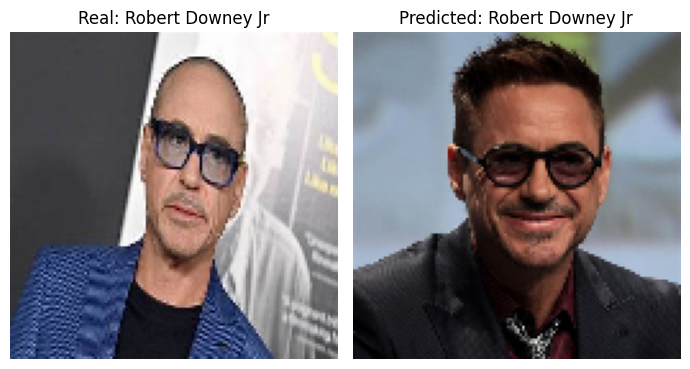

Predicted Actor: Robert Downey Jr


In [112]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Robert.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(7, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Robert Downey Jr")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")



Test Image  not in Data Set 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


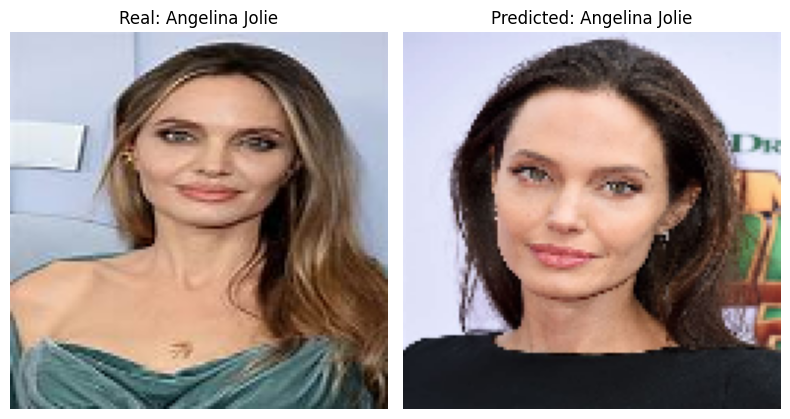

Predicted Actor: Angelina Jolie


In [113]:

# Load the real image (input image)
img_path = r"C:\Users\PMLS\Desktop\Angelina Jolie2.jpg"
img = image.load_img(img_path, target_size=(img_size, img_size))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)

# Make prediction
prediction = model.predict(img_array)
predicted_index = np.argmax(prediction)
actor_name = list(train_generator.class_indices.keys())[predicted_index]

# Load predicted image from dataset (first image of predicted actor)
predicted_actor_path = os.path.join(data_path, actor_name)
predicted_images = [os.path.join(predicted_actor_path, img) for img in os.listdir(predicted_actor_path) if img.endswith(('.jpg', '.png'))]
predicted_img_path = predicted_images[0] if predicted_images else None

# Display real and predicted images side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Show real image with high-quality resizing
img_cv = cv2.imread(img_path)
img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_cv = cv2.resize(img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
axes[0].imshow(img_cv)
axes[0].set_title("Real: Angelina Jolie")
axes[0].axis("off")

# Show predicted image (if available) with high-quality resizing
if predicted_img_path:
    predicted_img_cv = cv2.imread(predicted_img_path)
    predicted_img_cv = cv2.cvtColor(predicted_img_cv, cv2.COLOR_BGR2RGB)
    predicted_img_cv = cv2.resize(predicted_img_cv, (img_size, img_size), interpolation=cv2.INTER_LANCZOS4)  # High-quality interpolation
    axes[1].imshow(predicted_img_cv)
    axes[1].set_title(f"Predicted: {actor_name}")
    axes[1].axis("off")
else:
    axes[1].set_title(f"Predicted: {actor_name} (No image found)")
    axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Predicted Actor: {actor_name}")